In [29]:
# Download pre-trained model
import os

if not os.path.exists('checkpoints/checkpoint_epoch_200.pth'):
    print("Downloading model...")
    !pip install -q gdown
    !mkdir -p checkpoints
    !gdown 16KOjsu25S74SmWW5qciOpZKDW3i-hWmh -O checkpoints/checkpoint_epoch_200.pth
    print("Download complete!")
else:
    print("Model already exists!")


Model already exists!


In [30]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import sys

sys.path.append('src')

from dataset import PBRBasecolorDataset

In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"{device}")

cuda


In [33]:
raw_dirs = [
    "data/raw_light1",
    "data/raw_light2", 
    "data/raw_light3",
    "data/raw_light4",
    "data/raw_light5",
    "data/raw_light6",
]
basecolor_dir = "data/basecolor"
image_size = 256

dataset = PBRBasecolorDataset(
    raw_dirs=raw_dirs,
    basecolor_dir=basecolor_dir,
    image_size=image_size,
)



In [23]:
from model import SimpleUNet

# Create model
model = SimpleUNet(
    in_channels=3, 
    out_channels=3, 
    base_channels=128
)

# Try loading different checkpoints

checkpoint_paths = [
    "checkpoints/checkpoint_epoch_250.pth",
    "checkpoints/checkpoint_epoch_200.pth",
    "checkpoints/checkpoint_epoch_150.pth",
    "checkpoints/checkpoint_epoch_100.pth",
    "checkpoints/checkpoint_epoch_50.pth",
]

checkpoint = None
for path in checkpoint_paths:
    try:
        checkpoint = torch.load(path, map_location='cpu')
        checkpoint_path = path
        print(f"Loaded: {path}")
        break
    except:
        continue

if checkpoint is None:
    raise RuntimeError("No checkpoint file available!")

model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"Model loaded successfully from: {checkpoint_path}")
print(f"Epoch: {checkpoint['epoch']}, Loss: {checkpoint['loss']:.6f}")


Loaded: checkpoints/checkpoint_epoch_200.pth
Model loaded successfully from: checkpoints/checkpoint_epoch_200.pth
Epoch: 200, Loss: 0.219566


Test image #30
MSE: 0.000654, PSNR: 31.84 dB


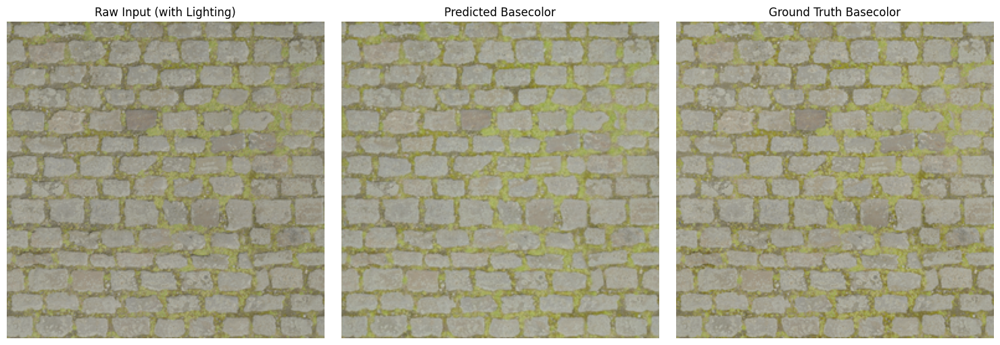

In [24]:
# Select test image

test_idx = 30

# Get data

raw, ground_truth = dataset[test_idx]

# Predict

with torch.no_grad():
    input_tensor = raw.unsqueeze(0)
    prediction = model(input_tensor)
    prediction = prediction.squeeze(0)

# Calculate error

mse = torch.mean((prediction - ground_truth) ** 2).item()
psnr = 10 * np.log10(1.0 / mse) if mse > 0 else float('inf')

print(f"Test image #{test_idx}")
print(f"MSE: {mse:.6f}, PSNR: {psnr:.2f} dB")

# Visualize

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

raw_np = np.clip(raw.permute(1, 2, 0).numpy(), 0, 1)
pred_np = np.clip(prediction.permute(1, 2, 0).numpy(), 0, 1)
gt_np = np.clip(ground_truth.permute(1, 2, 0).numpy(), 0, 1)

axes[0].imshow(raw_np)
axes[0].set_title(f"Raw Input (with Lighting)", fontsize=12)
axes[0].axis("off")

axes[1].imshow(pred_np)
axes[1].set_title(f"Predicted Basecolor", fontsize=12)
axes[1].axis("off")

axes[2].imshow(gt_np)
axes[2].set_title(f"Ground Truth Basecolor", fontsize=12)
axes[2].axis("off")

plt.tight_layout()
plt.show()


Test multiple images (different lighting conditions)

Image #10 - MSE: 0.000735, PSNR: 31.34 dB


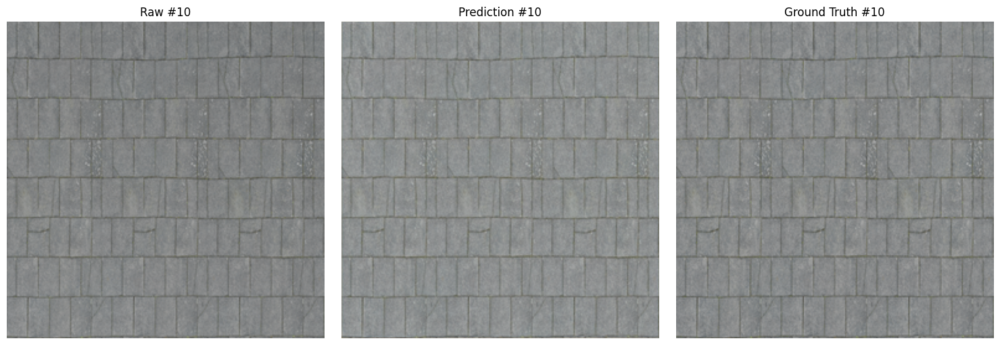

Image #51 - MSE: 0.000291, PSNR: 35.36 dB


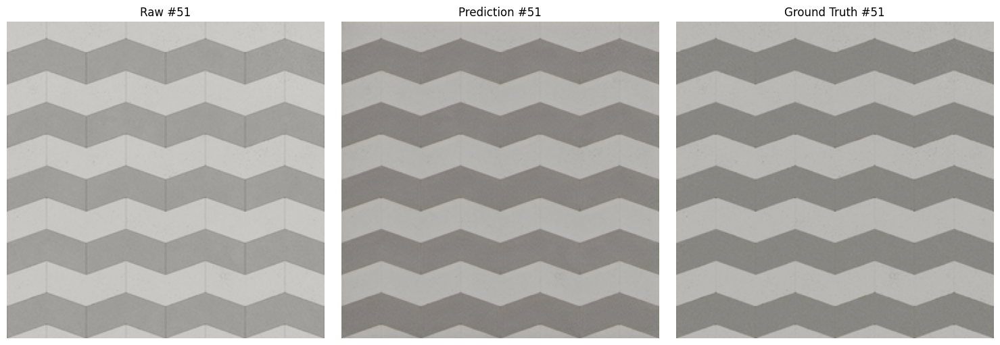

Image #105 - MSE: 0.000147, PSNR: 38.33 dB


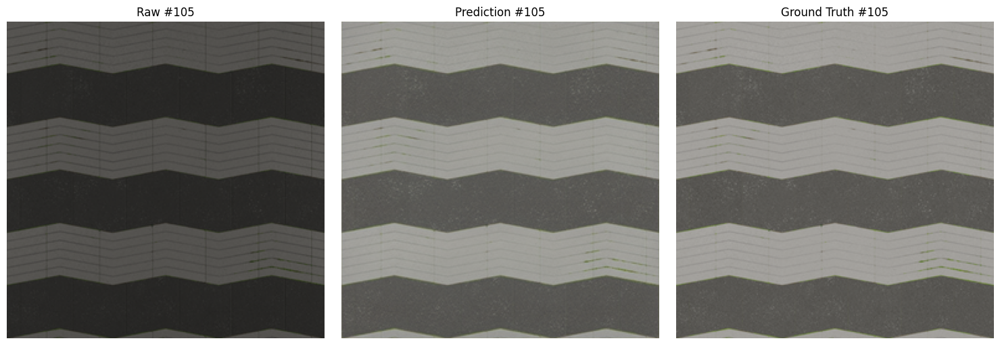

Image #156 - MSE: 0.000554, PSNR: 32.57 dB


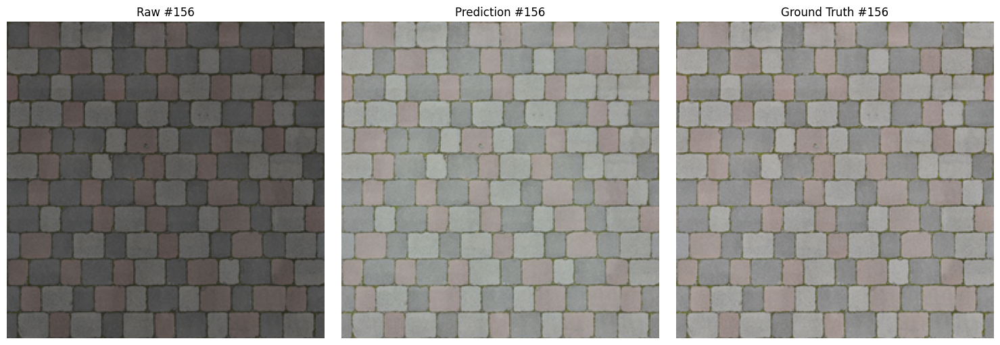

Image #207 - MSE: 0.000592, PSNR: 32.28 dB


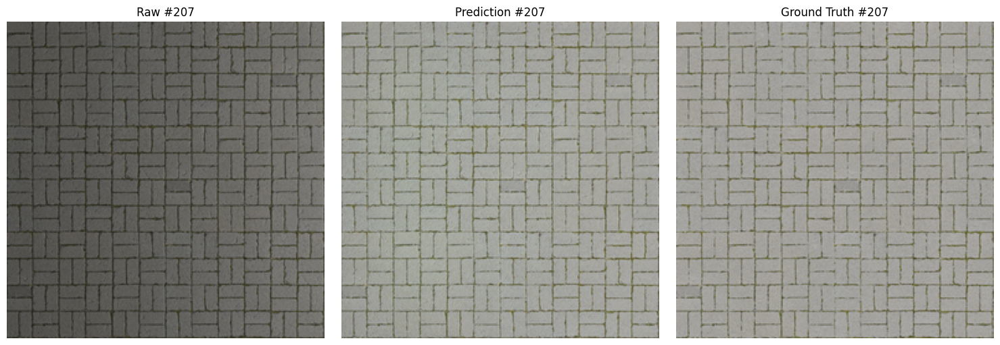

Image #258 - MSE: 0.000466, PSNR: 33.32 dB


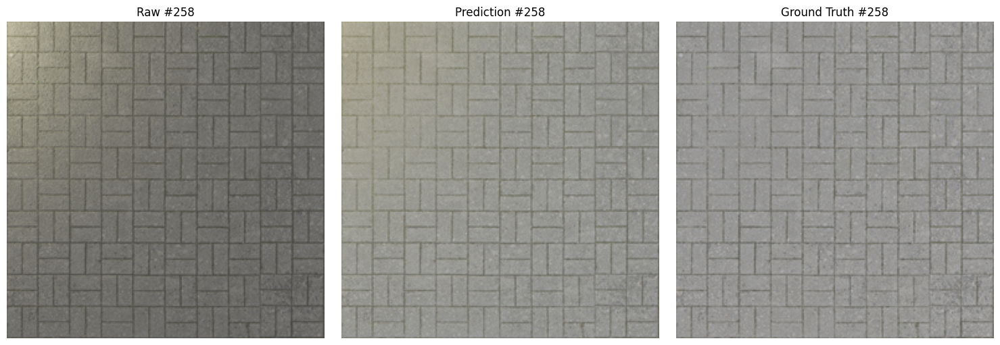

In [25]:
# Select test images from different lighting conditions

test_indices = [10, 51, 105, 156, 207, 258]

for idx in test_indices:
    if idx >= len(dataset):
        continue
    
    # Get data

    raw, ground_truth = dataset[idx]
    
    # Predict

    with torch.no_grad():
        input_tensor = raw.unsqueeze(0)
        prediction = model(input_tensor).squeeze(0)
    
    # Calculate error

    mse = torch.mean((prediction - ground_truth) ** 2).item()
    psnr = 10 * np.log10(1.0 / mse) if mse > 0 else float('inf')
    
    print(f"Image #{idx} - MSE: {mse:.6f}, PSNR: {psnr:.2f} dB")
    
    # Visualize

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    raw_np = np.clip(raw.permute(1, 2, 0).numpy(), 0, 1)
    pred_np = np.clip(prediction.permute(1, 2, 0).numpy(), 0, 1)
    gt_np = np.clip(ground_truth.permute(1, 2, 0).numpy(), 0, 1)
    
    axes[0].imshow(raw_np)
    axes[0].set_title(f"Raw #{idx}", fontsize=12)
    axes[0].axis("off")
    
    axes[1].imshow(pred_np)
    axes[1].set_title(f"Prediction #{idx}", fontsize=12)
    axes[1].axis("off")
    
    axes[2].imshow(gt_np)
    axes[2].set_title(f"Ground Truth #{idx}", fontsize=12)
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()


Test on custom images

Found 2 images


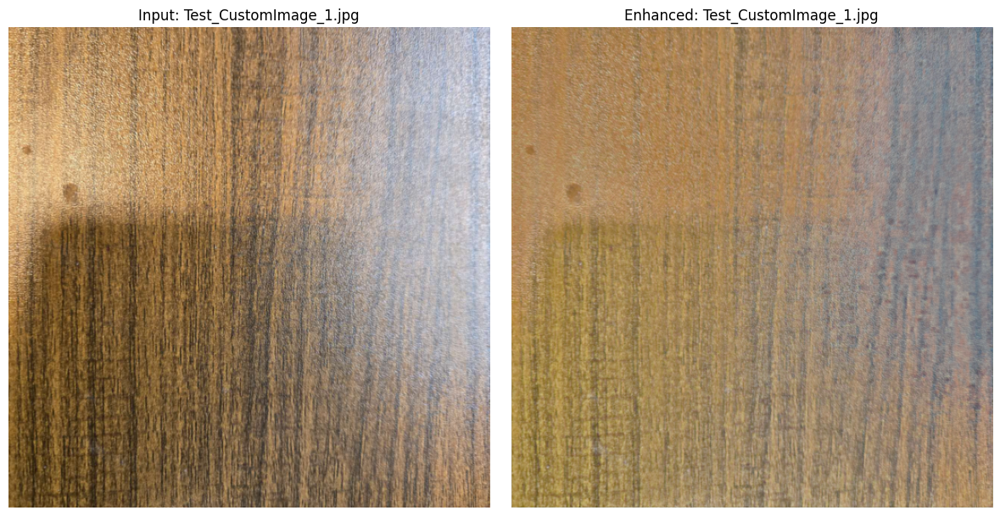

Saved: /home/s5820023/Desktop/ml-programming-assignment-JingwenWang27/Test_custom image/results/enhanced_Test_CustomImage_1.jpg


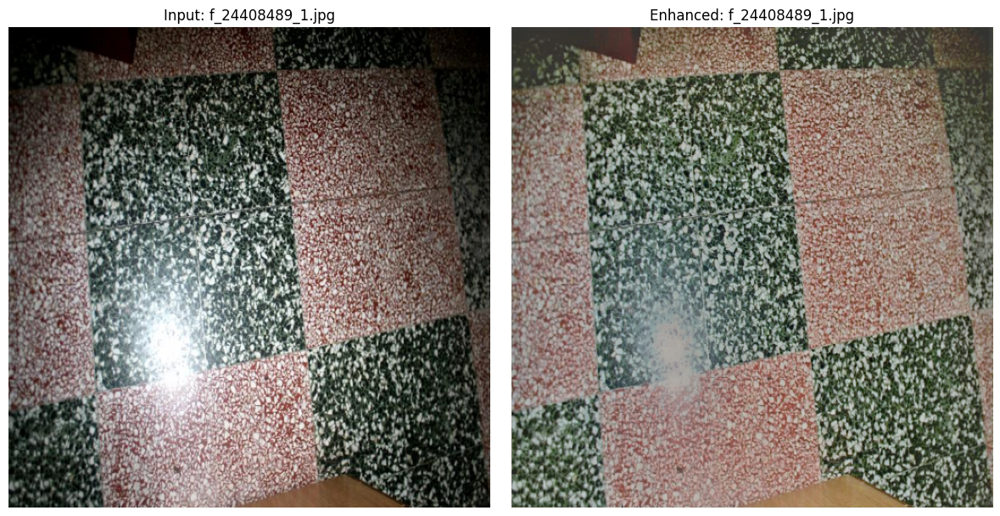

Saved: /home/s5820023/Desktop/ml-programming-assignment-JingwenWang27/Test_custom image/results/enhanced_f_24408489_1.jpg

All enhanced images saved to: /home/s5820023/Desktop/ml-programming-assignment-JingwenWang27/Test_custom image/results


In [28]:
from PIL import Image
import torchvision.transforms as transforms
import os

# Custom image folder
image_folder = "/home/s5820023/Desktop/ml-programming-assignment-JingwenWang27/Test_custom image"
output_folder = os.path.join(image_folder, "results")

# Create output folder if not exists
os.makedirs(output_folder, exist_ok=True)

# Define transform

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

# Get all image files
# 获取所有图片文件
image_files = [f for f in os.listdir(image_folder) 
               if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

if len(image_files) == 0:
    print(f"No image files found in {image_folder}")
else:
    print(f"Found {len(image_files)} images")
    
    for img_file in image_files:
        image_path = os.path.join(image_folder, img_file)
        
        try:
            # Load and preprocess
            # 加载并预处理
            custom_image = Image.open(image_path).convert('RGB')
            input_tensor = transform(custom_image).unsqueeze(0)
            
            # Predict
            # 预测
            with torch.no_grad():
                output = model(input_tensor).squeeze(0)
            
            # Visualize
            # 可视化
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            
            axes[0].imshow(np.clip(input_tensor.squeeze(0).permute(1, 2, 0).numpy(), 0, 1))
            axes[0].set_title(f"Input: {img_file}")
            axes[0].axis("off")
            
            axes[1].imshow(np.clip(output.permute(1, 2, 0).numpy(), 0, 1))
            axes[1].set_title(f"Enhanced: {img_file}")
            axes[1].axis("off")
            
            plt.tight_layout()
            plt.show()
            
            # Save output to results folder
            # 保存输出到 results 文件夹
            output_path = os.path.join(output_folder, f"enhanced_{img_file}")
            output_image = transforms.ToPILImage()(output)
            output_image.save(output_path)
            print(f"Saved: {output_path}")
            
        except Exception as e:
            print(f"Error processing {img_file}: {e}")

print(f"\nAll enhanced images saved to: {output_folder}")
